In [1]:
import pandas as pd
import os
cur_dir = os.getcwd()

In [2]:
raw_data = pd.read_csv(f'{cur_dir}\\data\\raw_data.csv')
raw_data.set_index(['composition','trial','time'],drop=True,inplace=True)

smooth_data = pd.read_csv(f'{cur_dir}\\data\\smooth_data.csv')
smooth_data.set_index(['composition','trial','time'],drop=True,inplace=True)

kinetic_data = pd.read_csv(f'{cur_dir}\\data\\kinetic_data.csv')
kinetic_data.set_index(['composition', 'time'],drop=True,inplace=True)

In [3]:
from data_processing.subtract_one_day import subtract_one_day
raw_data_adjusted = subtract_one_day(raw_data)

In [4]:
from data_processing.calculate_slopes import calculate_slopes
raw_data_slopes = calculate_slopes(raw_data_adjusted)
raw_data_slopes.to_csv(f'{cur_dir}\\data\\raw_data_slopes.csv')

smooth_data_slopes = calculate_slopes(smooth_data)
smooth_data_slopes.to_csv(f'{cur_dir}\\data\\smooth_data_slopes.csv')

kinetic_data_slopes = calculate_slopes(kinetic_data)
kinetic_data_slopes.to_csv(f'{cur_dir}\\data\\kinetic_data_slopes.csv')

In [5]:
display(raw_data_slopes.head(2))
display(smooth_data_slopes.head(2))
display(kinetic_data_slopes.head(2))

,trial,time,acetate,biomass,butanol,butyrate,ethanol,Δ acetate,Δ biomass,Δ butanol,Δ butyrate,Δ ethanol,CO,CO2,H2,Flow Rate
1,1,0.58,21.61,0.41,0.04,0.06,10.94,324.285714,-0.285714,0.142857,0.285714,70.714286,0.5,0.375,0.125,1
1,1,0.65,44.31,0.39,0.05,0.08,15.89,5.081081,0.189189,0.432432,1.513514,-20.945946,0.5,0.375,0.125,1


,trial,time,acetate,biomass,butanol,butyrate,ethanol,Δ acetate,Δ biomass,Δ butanol,Δ butyrate,Δ ethanol,CO,CO2,H2,Flow Rate
1,1,0.0,16.905029,0.429546,0.029818,0.075529,15.895240,10.961665,-0.084697,-0.015584,-0.144950,-2.882172,0.5,0.375,0.125,1
1,1,0.1,18.001195,0.421076,0.028260,0.061033,15.607023,18.298778,-0.102733,0.000561,-0.100208,-4.628878,0.5,0.375,0.125,1


,trial,time,acetate,biomass,butanol,butyrate,ethanol,Δ acetate,Δ biomass,Δ butanol,Δ butyrate,Δ ethanol,CO,CO2,H2,Flow Rate
1,0,0.0,15.992719,0.409529,0.105137,0.068777,16.239544,19.353866,0.549437,0.0,0.0,0.0,0.5,0.375,0.125,1
1,0,0.1,17.928105,0.464472,0.105137,0.068777,16.239544,21.794745,0.618731,0.0,0.0,0.0,0.5,0.375,0.125,1


In [6]:
from ml_slope_model.get_ml_slope_prediction_dict import get_ml_slope_prediction_dict

slope_ml_dict_from_raw_rf = get_ml_slope_prediction_dict(raw_data_slopes, smooth_data_slopes, 'random forest')
slope_ml_dict_from_smooth_rf = get_ml_slope_prediction_dict(smooth_data_slopes, smooth_data_slopes, 'random forest')
slope_ml_dict_from_kinetic_rf = get_ml_slope_prediction_dict(kinetic_data_slopes, smooth_data_slopes, 'random forest')

slope_ml_dict_from_smooth_gb = get_ml_slope_prediction_dict(smooth_data_slopes, smooth_data_slopes, 'gradient boosting')
slope_ml_dict_from_raw_gb = get_ml_slope_prediction_dict(raw_data_slopes, smooth_data_slopes, 'gradient boosting')
slope_ml_dict_from_kinetic_gb = get_ml_slope_prediction_dict(kinetic_data_slopes, smooth_data_slopes, 'gradient boosting')

In [7]:
from plotting.plot_ml_predictions import plot_ml_predictions
plot_ml_predictions(
    slope_ml_dict_from_raw_rf,
    'slope',
    'ML Slope Predictions with Raw Data Trained with Random Forest'
)

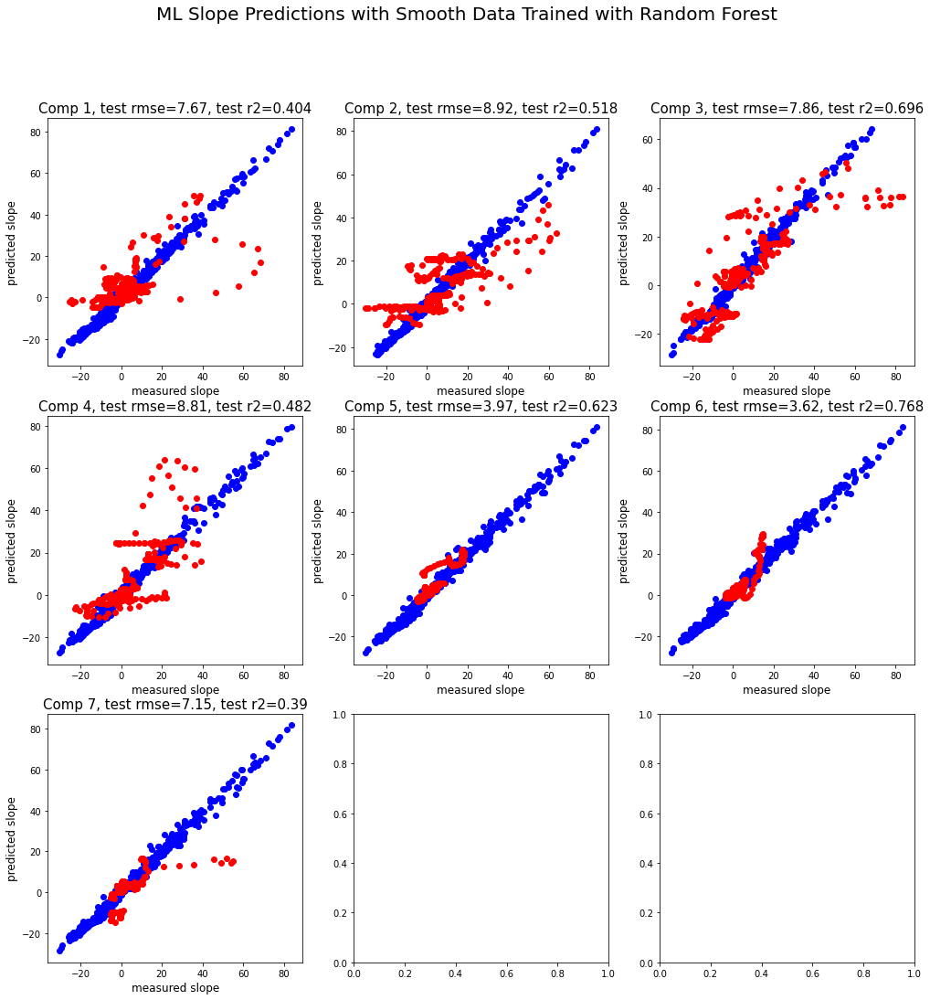

In [8]:
plot_ml_predictions(
    slope_ml_dict_from_smooth_rf,
    'slope',
    'ML Slope Predictions with Smooth Data Trained with Random Forest'
)

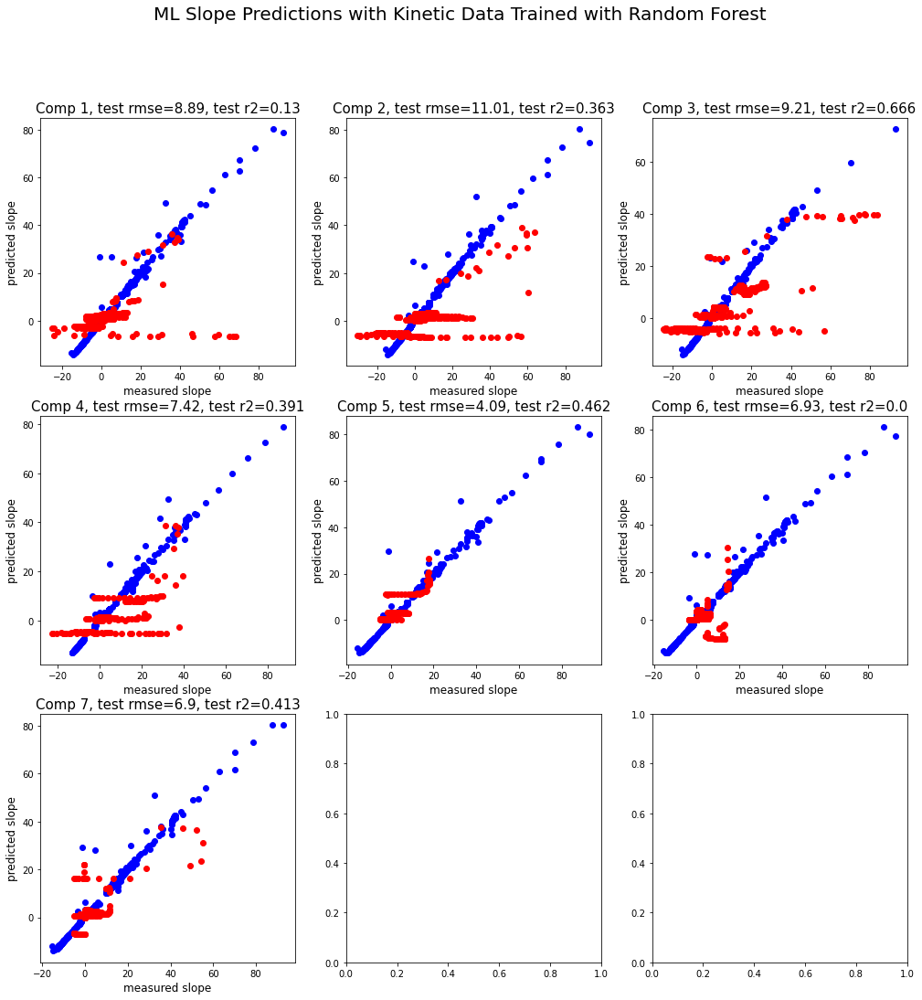

In [9]:
plot_ml_predictions(
    slope_ml_dict_from_kinetic_rf,
    'slope',
    'ML Slope Predictions with Kinetic Data Trained with Random Forest'
)

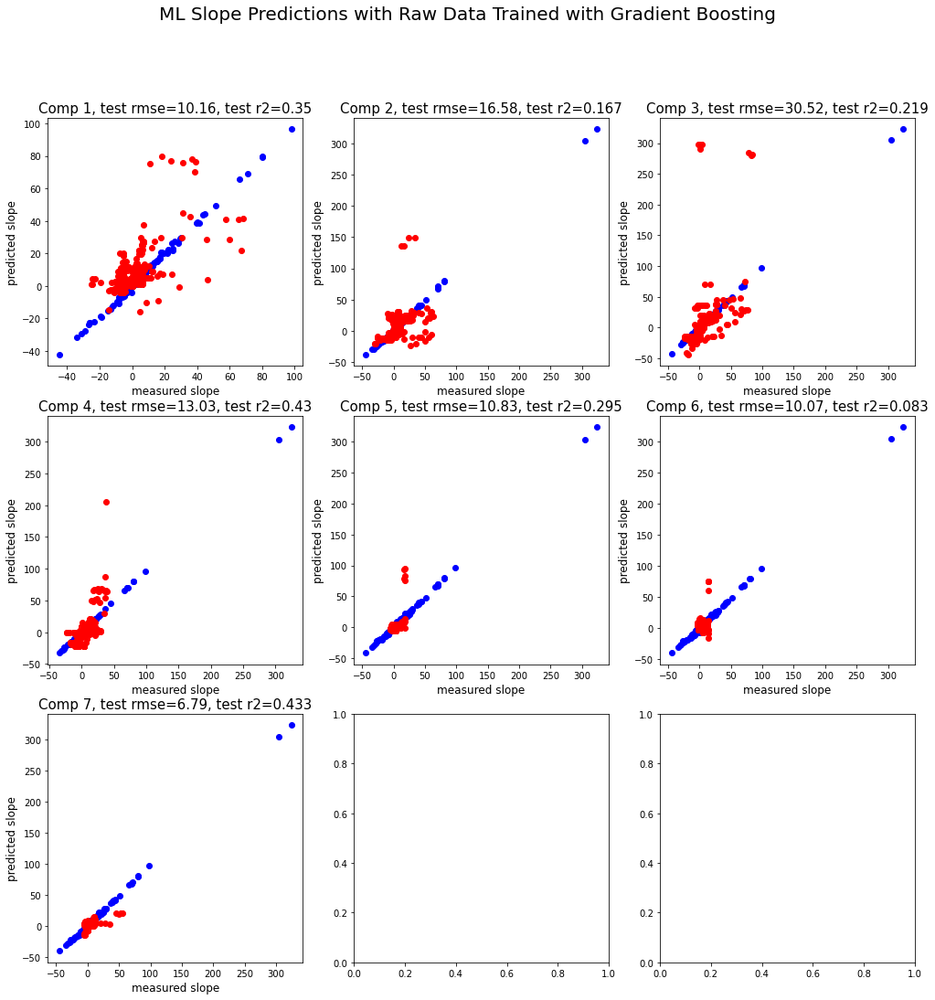

In [10]:
plot_ml_predictions(
    slope_ml_dict_from_raw_gb,
    'slope',
    'ML Slope Predictions with Raw Data Trained with Gradient Boosting'
)

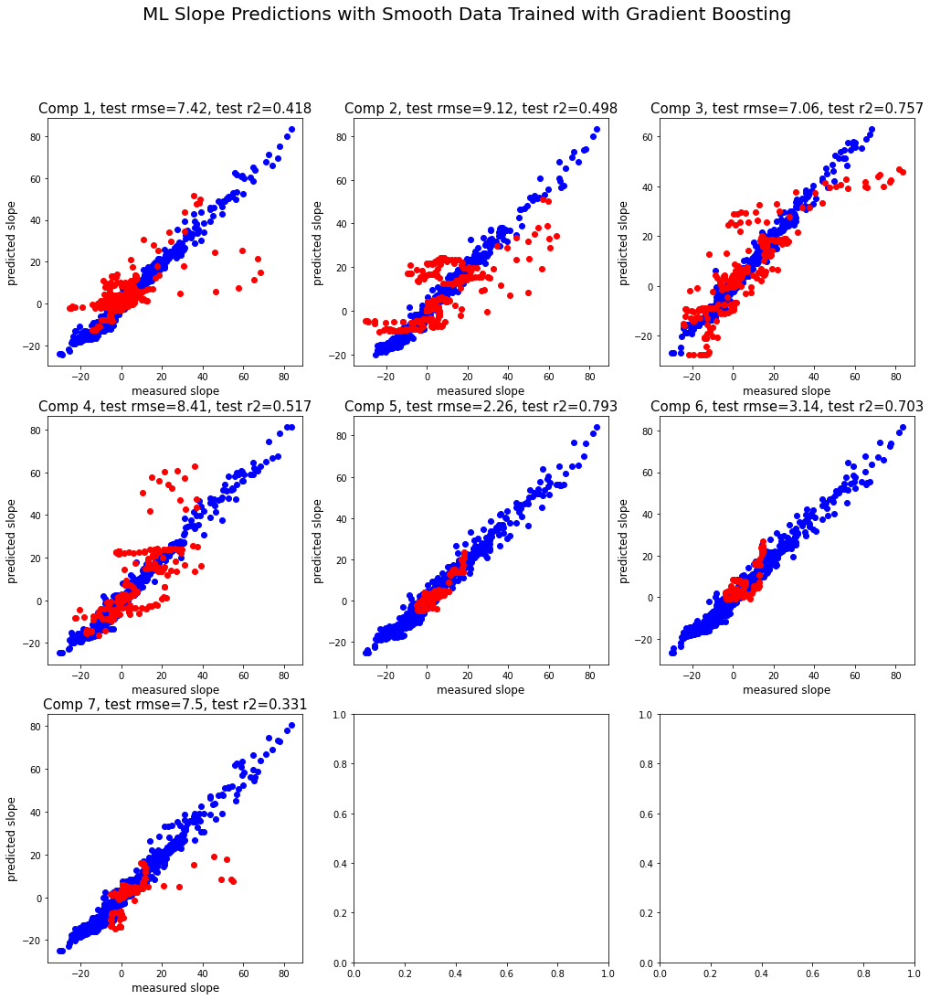

In [11]:
plot_ml_predictions(
    slope_ml_dict_from_smooth_gb,
    'slope',
    'ML Slope Predictions with Smooth Data Trained with Gradient Boosting'
)

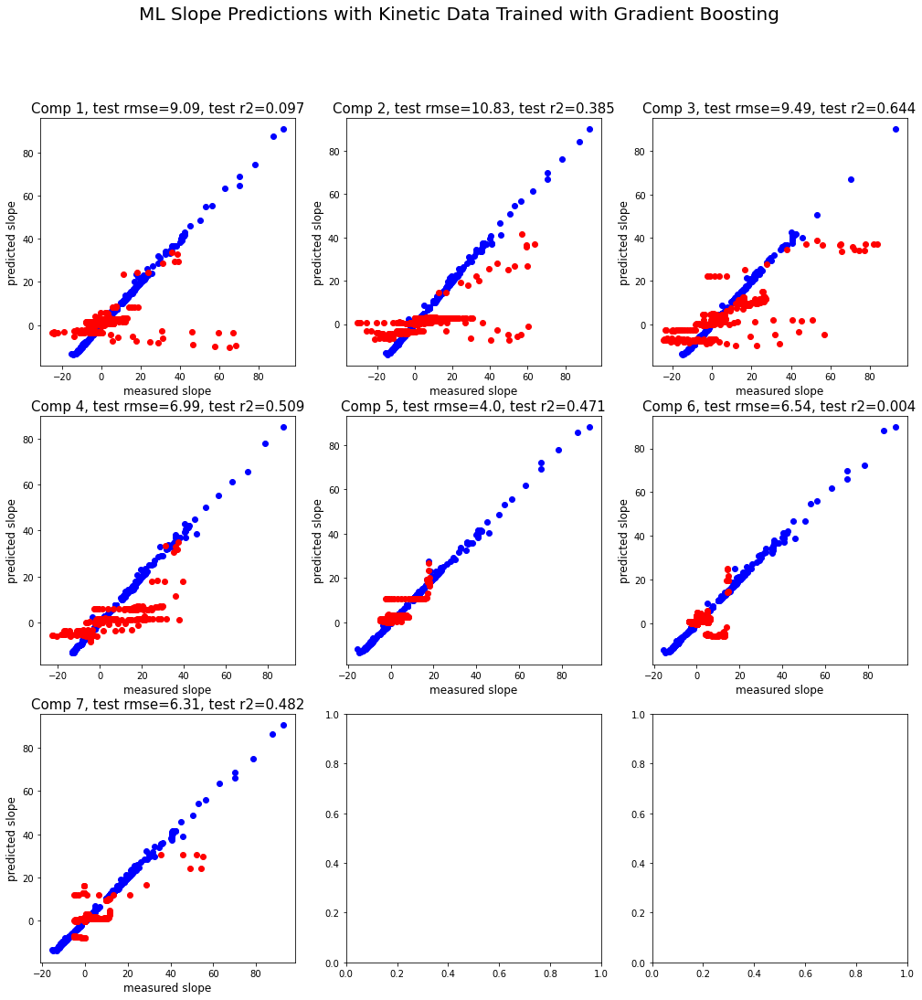

In [12]:
plot_ml_predictions(
    slope_ml_dict_from_kinetic_gb,
    'slope',
    'ML Slope Predictions with Kinetic Data Trained with Gradient Boosting'
)

In [13]:
from ml_slope_model.get_ml_slope_time_course_data import get_ml_slope_time_course_data


time_course_df_from_raw_rf = get_ml_slope_time_course_data(slope_ml_dict_from_raw_rf, smooth_data)
time_course_df_from_smooth_rf = get_ml_slope_time_course_data(slope_ml_dict_from_smooth_rf, smooth_data)
time_course_df_from_kinetic_rf = get_ml_slope_time_course_data(slope_ml_dict_from_kinetic_rf, smooth_data)
time_course_df_from_raw_gb = get_ml_slope_time_course_data(slope_ml_dict_from_raw_gb, smooth_data)
time_course_df_from_smooth_gb = get_ml_slope_time_course_data(slope_ml_dict_from_smooth_gb, smooth_data)
time_course_df_from_kinetic_gb = get_ml_slope_time_course_data(slope_ml_dict_from_kinetic_gb, smooth_data)


comp 1
comp 2
comp 3
comp 4
comp 5
comp 6
comp 7

comp 1
comp 2
comp 3
comp 4
comp 5
comp 6
comp 7

comp 1
comp 2
comp 3
comp 4
comp 5
comp 6
comp 7

comp 1
comp 2
comp 3
comp 4
comp 5
comp 6
comp 7

comp 1
comp 2
comp 3
comp 4
comp 5
comp 6
comp 7

comp 1
comp 2
comp 3
comp 4
comp 5
comp 6
comp 7


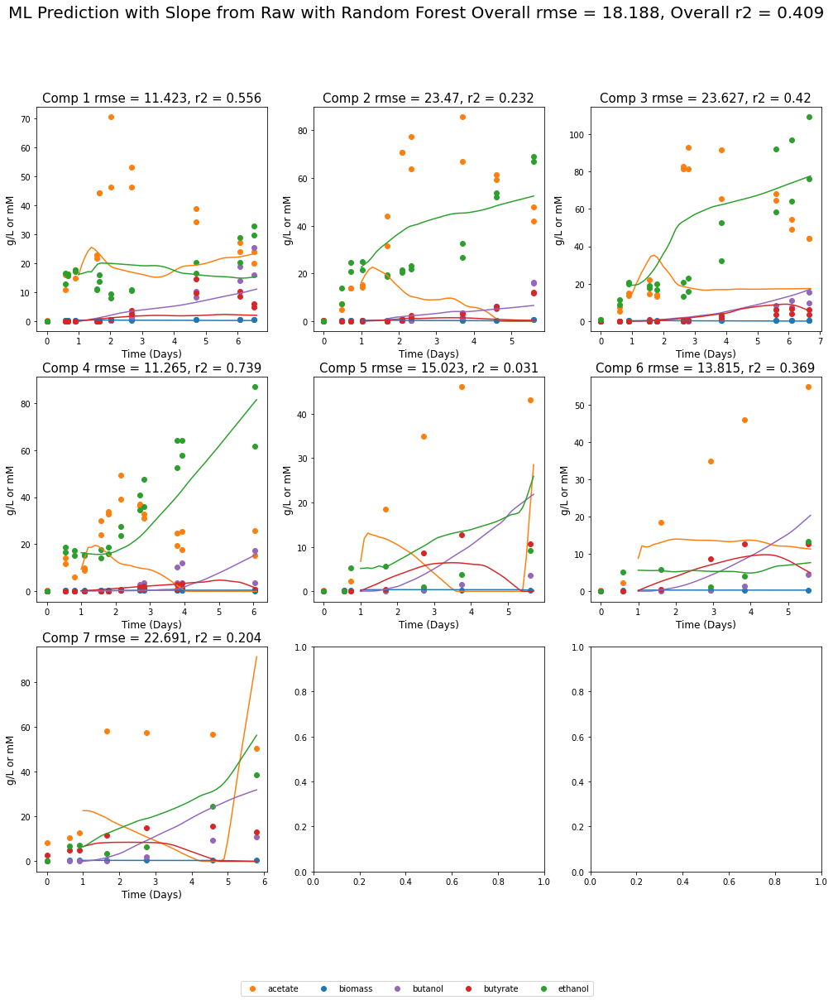

In [14]:
from plotting.plot_fit import plot_fit
plot_fit(time_course_df_from_raw_rf, raw_data, 'ML Prediction with Slope from Raw with Random Forest', False)

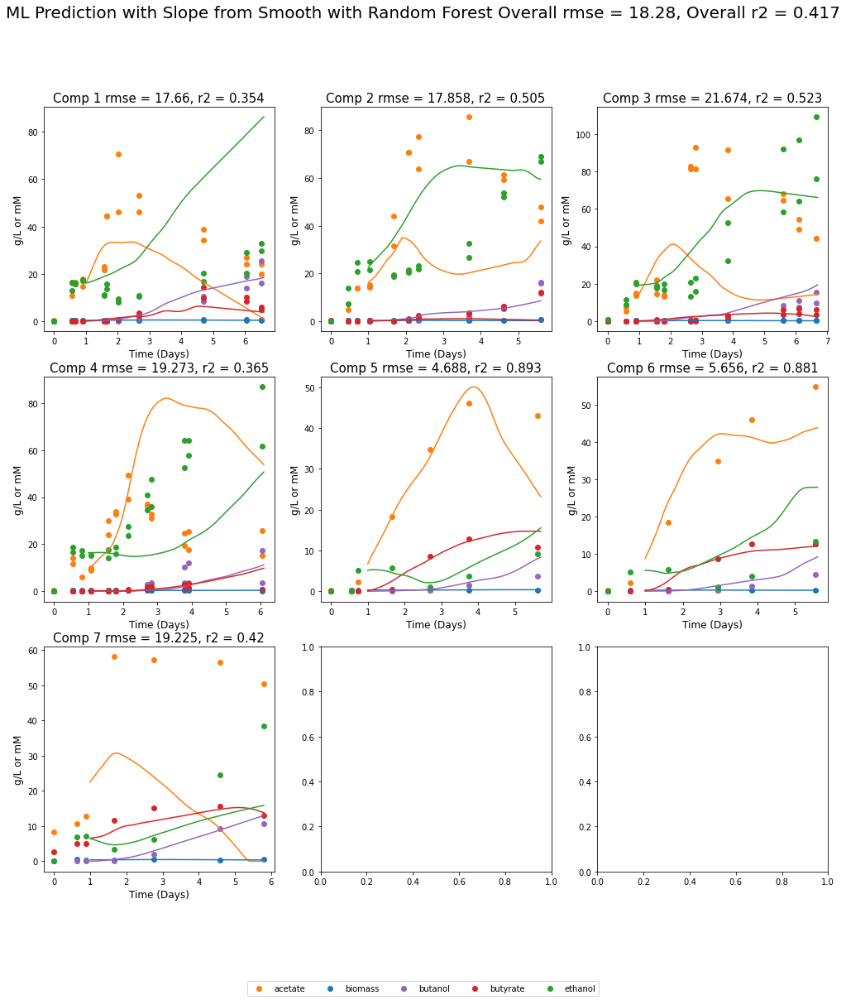

In [15]:
plot_fit(time_course_df_from_smooth_rf, raw_data, 'ML Prediction with Slope from Smooth with Random', False)

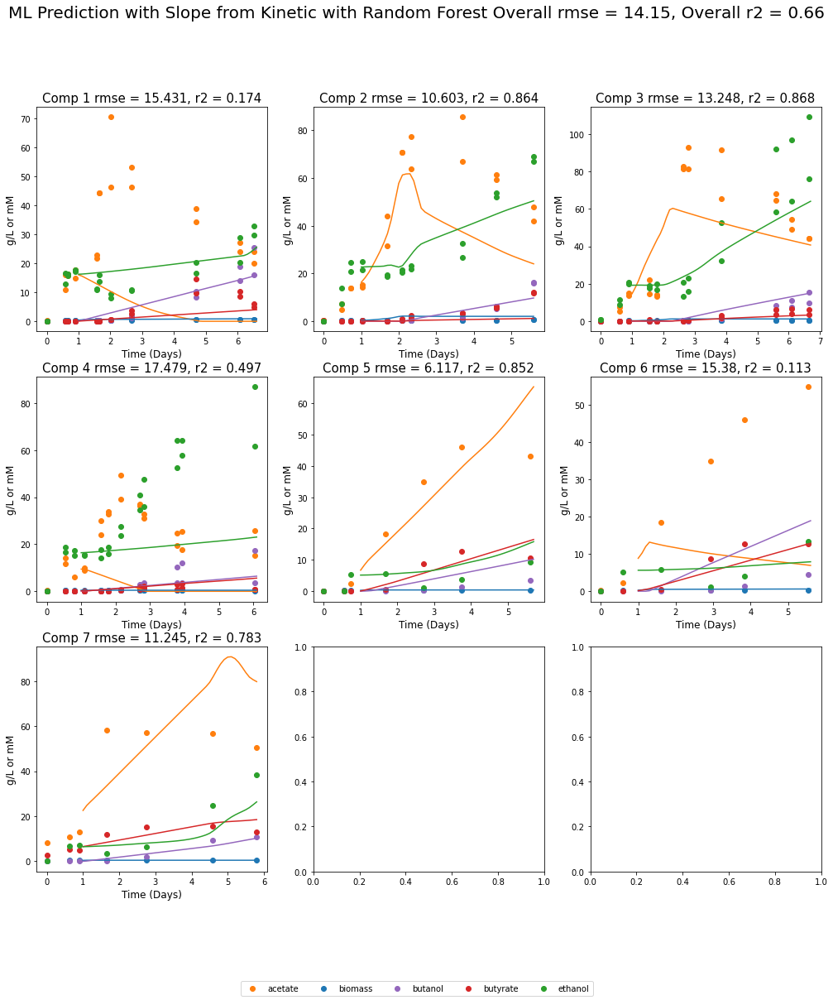

In [16]:
plot_fit(time_course_df_from_kinetic_rf, raw_data, 'ML Prediction with Slope from Kinetic with Random Forest', False)

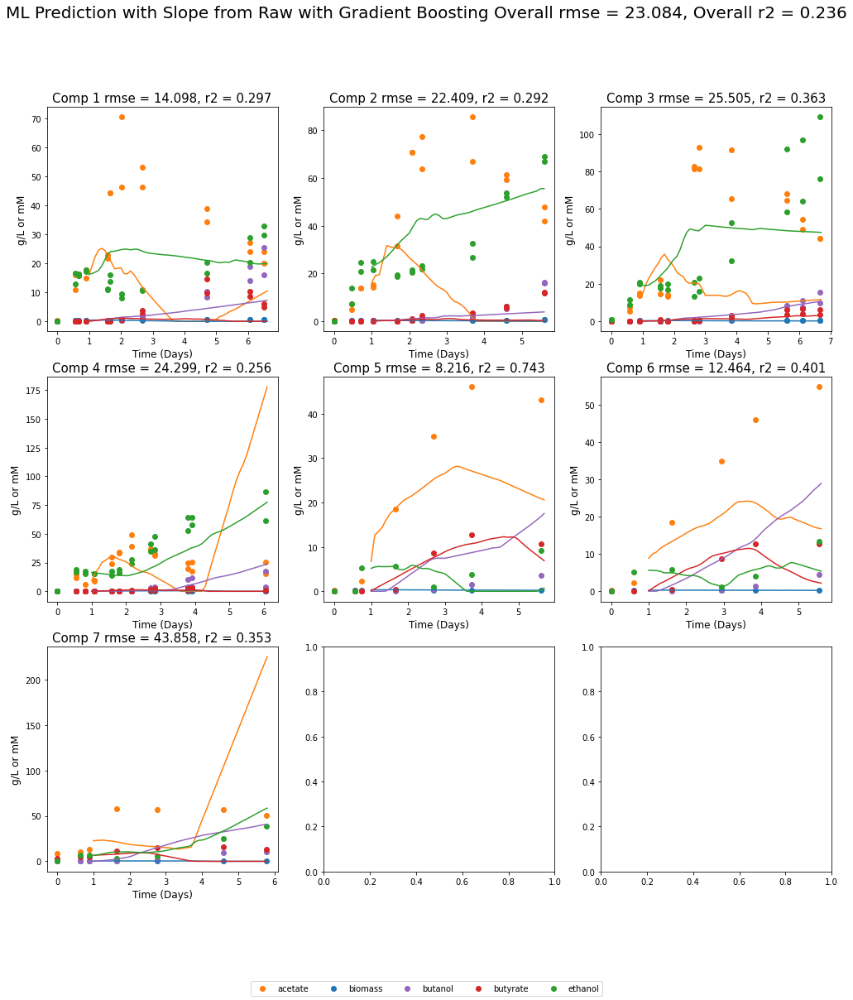

In [17]:
plot_fit(time_course_df_from_raw_gb, raw_data, 'ML Prediction with Slope from Raw with Gradient Boosting', False)

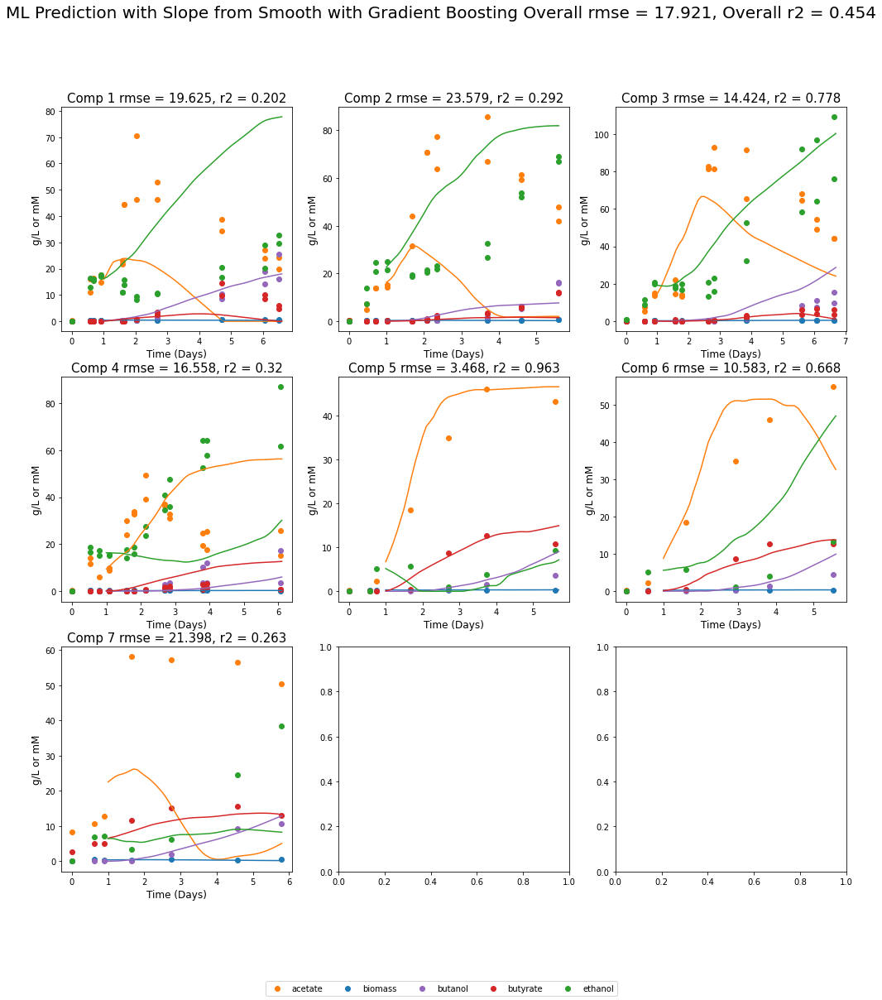

In [18]:
plot_fit(time_course_df_from_smooth_gb, raw_data, 'ML Prediction with Slope from Smooth with Gradient Boosting', False)

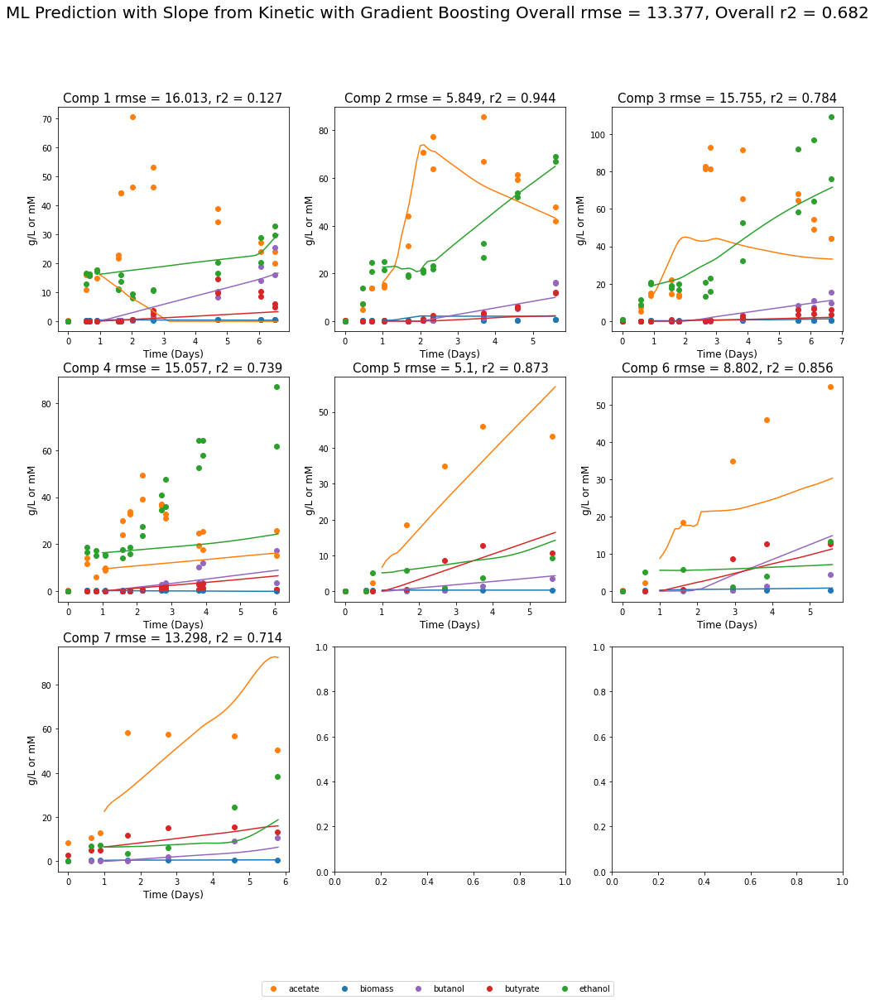

In [19]:
plot_fit(time_course_df_from_kinetic_gb, raw_data, 'ML Prediction with Slope from Kinetic with Gradient Boosting', False)